In [91]:
from thesis import SAVED_RESULTS_PATH
import os
import matplotlib.pyplot as plt
import numpy as np
from typing import Optional
import scanpy as sc


FIGURES_PATH = SAVED_RESULTS_PATH / "figures"
os.makedirs(FIGURES_PATH, exist_ok=True)

In [92]:
def get_umap_counts(pipeline, filename: Optional[str] = None, target_cell_type: str = "Hepatocytes - portal", condition: str = 'Dose'):
    dataset = pipeline.dataset
    dataset.obs["split"] = "~train"
    dataset.obs["splittest"] = "~test"
    
    cell_type_key = pipeline.cell_type_key

    train_adata = pipeline.get_train(target_cell_type=target_cell_type)
    test_adata_input = pipeline.get_ctrl_test(
        target_cell_type=target_cell_type
    )
    test_adata_evaluation = pipeline.get_stim_test(
        target_cell_type=target_cell_type
    )
    
    if condition == 'Dose':
        dataset.obs['Dose'] = dataset.obs['Dose'].astype('category')

    dataset.obs.loc[train_adata.obs_names, "split"] = "train"
    dataset.obs.loc[test_adata_input.obs_names, "splittest"] = "input"
    dataset.obs.loc[test_adata_evaluation.obs_names, "splittest"] = "evaluation"

    fig, axs = plt.subplots(2, 2, figsize=(16, 12))

    sc.pl.umap(dataset, color=cell_type_key, show=False, ax=axs[0, 0])
    axs[0, 0].set_title("Cell Type")

    sc.pl.umap(dataset, color=condition, show=False, ax=axs[0, 1])
    axs[0, 1].set_title(condition)

    sc.pl.umap(
        dataset,
        color="split",
        palette={
            "~train": plt.cm.Reds(0.8),
            "train": plt.cm.Blues(0.5)},
        show=False,
        ax=axs[1, 0],
    )
    axs[1, 0].set_title("Train")

    sc.pl.umap(
        dataset,
        color="splittest",
        palette={
            "~test": plt.cm.Reds(0.8),
            "input": plt.cm.Blues(0.5),
            "evaluation": plt.cm.Greens(0.4),
        },
        show=False,
        ax=axs[1, 1],
    )
    axs[1, 1].set_title("Test")

    plt.tight_layout()
    if filename is not None:
        fig.savefig(FIGURES_PATH / f"{filename}.png", dpi=300, bbox_inches="tight")
    plt.show()

/g/kreshuk/katzalis/repos/thesis/thesis/datasets.py:205: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  control.obs["condition"] = "control"
/g/kreshuk/katzalis/repos/thesis/thesis/datasets.py:206: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  perturb.obs["condition"] = "stimulated"


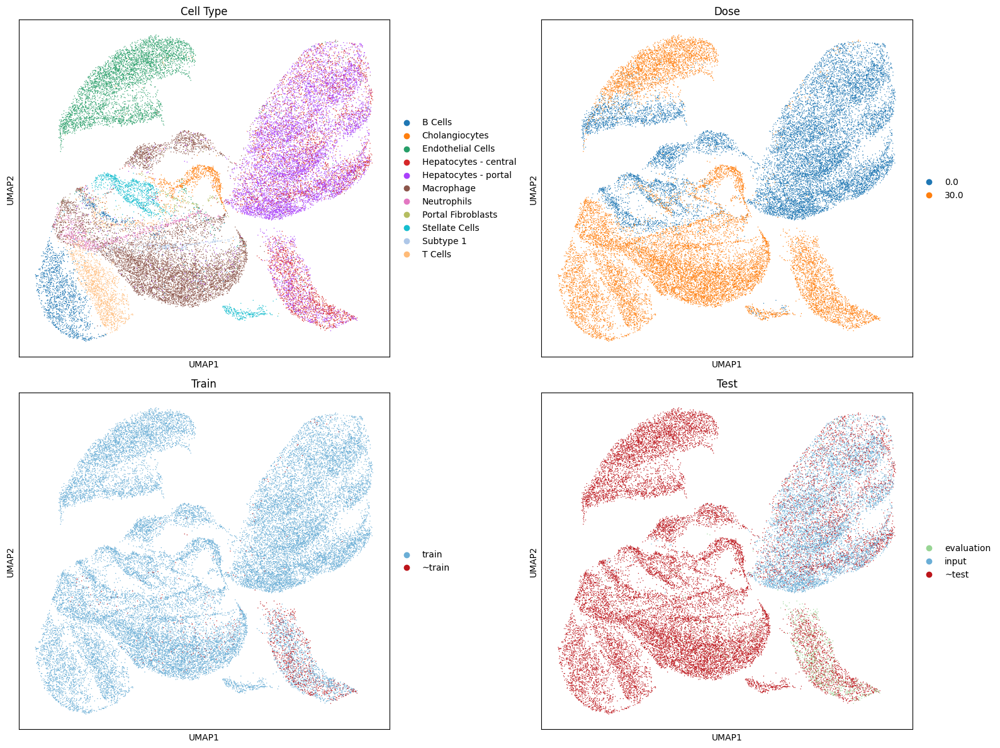

In [93]:
from thesis.datasets import NaultPipeline, NaultSinglePipeline

nault_single = NaultSinglePipeline(
    dataset_pipeline=NaultPipeline(preprocessing_pipeline=None), dosages=30
)
dataset = nault_single.dataset

sc.pp.pca(dataset)
sc.pp.neighbors(dataset)
sc.tl.umap(dataset)

get_umap_counts(nault_single, 'nault_umap_split_30')

In [94]:
from thesis.datasets import NaultPipeline, NaultMultiplePipeline

nault_multiple = NaultMultiplePipeline(
    dataset_pipeline=NaultPipeline(preprocessing_pipeline=None)
)
dataset = nault_multiple.dataset

sc.pp.pca(dataset)
sc.pp.neighbors(dataset)
sc.tl.umap(dataset)


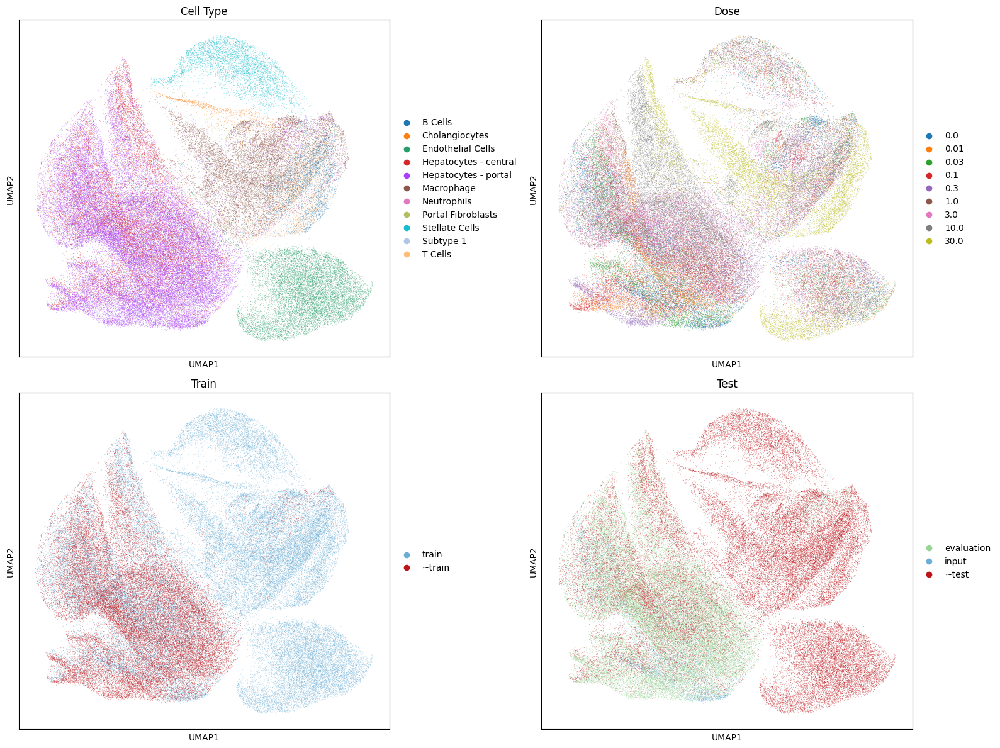

In [95]:
get_umap_counts(nault_multiple, 'nault_umap_split_multiple')

In [96]:
from thesis.datasets import NaultLiverTissuePipeline, NaultSinglePipeline

nault_single = NaultSinglePipeline(
    dataset_pipeline=NaultLiverTissuePipeline(preprocessing_pipeline=None), dosages=30
)
dataset = nault_single.dataset

sc.pp.pca(dataset)
sc.pp.neighbors(dataset)
sc.tl.umap(dataset)



/g/kreshuk/katzalis/repos/thesis/thesis/datasets.py:205: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  control.obs["condition"] = "control"
/g/kreshuk/katzalis/repos/thesis/thesis/datasets.py:206: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  perturb.obs["condition"] = "stimulated"


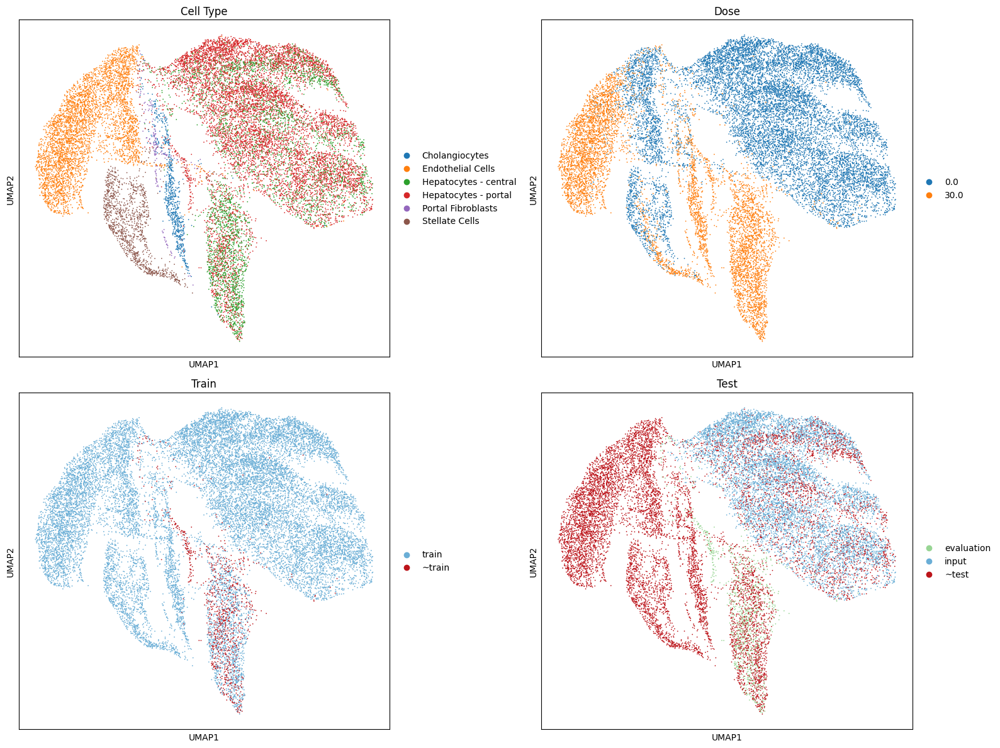

In [97]:
get_umap_counts(nault_single, 'nault_liver_umap_split_30')

In [98]:
from thesis.datasets import NaultLiverTissuePipeline, NaultMultiplePipeline

nault_multiple = NaultMultiplePipeline(
    dataset_pipeline=NaultLiverTissuePipeline(preprocessing_pipeline=None)
)
dataset = nault_multiple.dataset

sc.pp.pca(dataset)
sc.pp.neighbors(dataset)
sc.tl.umap(dataset)



/g/kreshuk/katzalis/conda/miniforge3/envs/thesis/lib/python3.10/site-packages/scanpy/preprocessing/_pca.py:317: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm[key_obsm] = X_pca


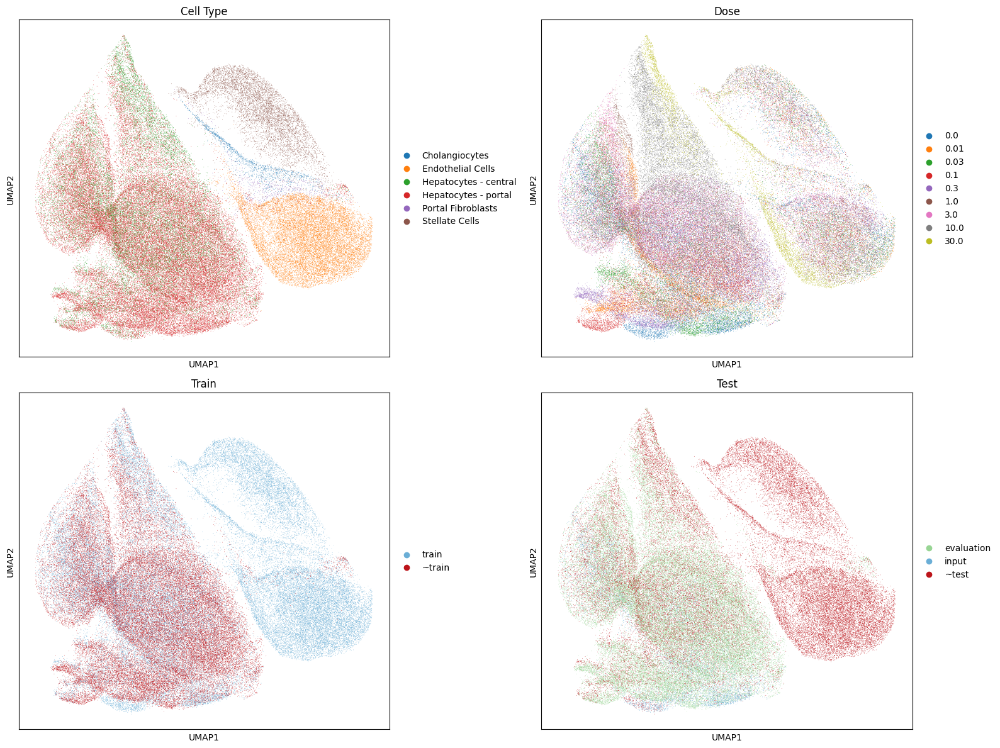

In [99]:
get_umap_counts(nault_multiple, 'nault_liver_umap_split_multiple')

In [100]:
from thesis.datasets import PbmcPipeline, PbmcSinglePipeline

pbmc = PbmcSinglePipeline(
    dataset_pipeline=PbmcPipeline(preprocessing_pipeline=None)
)
dataset = pbmc.dataset

sc.pp.pca(dataset)
sc.pp.neighbors(dataset)
sc.tl.umap(dataset)

/g/kreshuk/katzalis/repos/thesis/thesis/datasets.py:268: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  self.control.obs[dose_key] = 0.0
/g/kreshuk/katzalis/repos/thesis/thesis/datasets.py:269: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  self.perturb.obs[dose_key] = -1.0


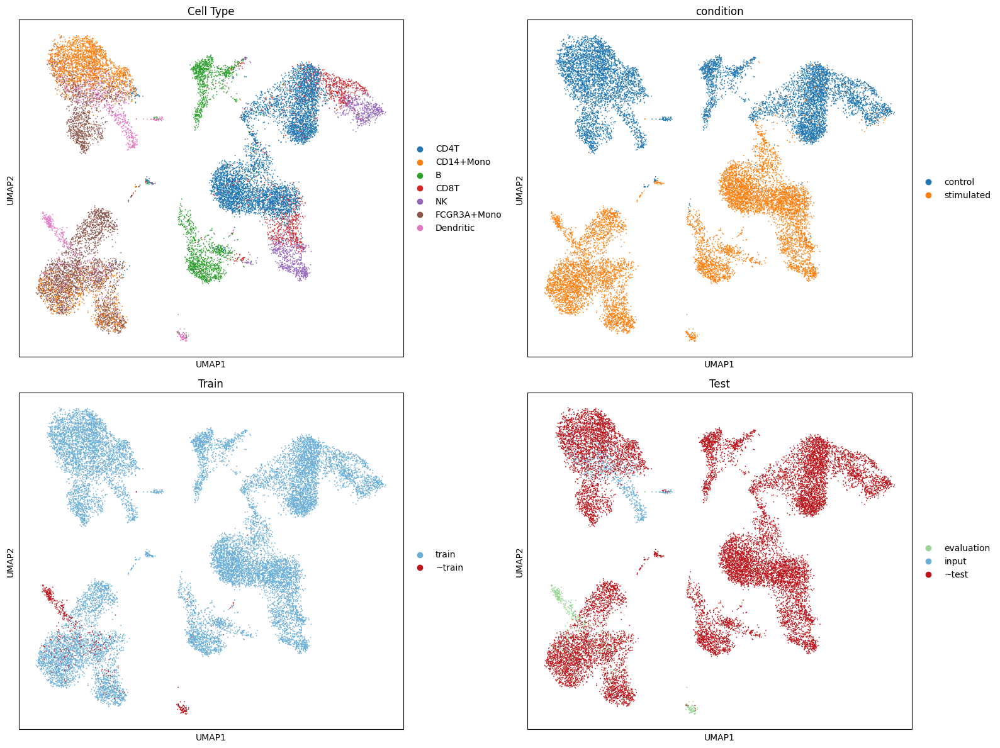

In [101]:
get_umap_counts(pbmc, 'pbmc_split', target_cell_type='Dendritic', condition='condition')

In [102]:
import matplotlib.pyplot as plt



def get_split_counts(pipeline, filename: Optional[str] = None, with_percentage: bool = False, ax=None):
    # Use the provided axis if available, otherwise create a new one (e.g., for standalone plotting)
    if ax is None:
        fig, ax = plt.subplots(figsize=(12, 10))

    dataset = pipeline.dataset
    width = 0.2
    cell_types = dataset.obs[pipeline.cell_type_key].unique().tolist()
    x = np.arange(len(cell_types))
    
    total_count = len(dataset)

    train_size_cell_types = []
    ctrl_test_size_cell_types = []
    stim_test_size_cell_types = []
    
    for cell_type in cell_types:
        train = pipeline.get_train(target_cell_type=cell_type)
        ctrl_test = pipeline.get_ctrl_test(target_cell_type=cell_type)
        stim_test = pipeline.get_stim_test(target_cell_type=cell_type)
        
        train_count = len(train)
        ctrl_count = len(ctrl_test)
        stim_count = len(stim_test)
        
        print(f'{cell_type}: train={train_count}, ctrl test={ctrl_count}, stim test={stim_count}')
        
        if with_percentage:
            train_count = train_count / total_count * 100
            ctrl_count = ctrl_count / total_count * 100
            stim_count = stim_count / total_count * 100
            print(f'{cell_type} with percentage: train={train_count}, ctrl test={ctrl_count}, stim test={stim_count}')
        
        train_size_cell_types.append(train_count)
        ctrl_test_size_cell_types.append(ctrl_count)
        stim_test_size_cell_types.append(stim_count)
        
    # Plotting on the specified axis
    ax.bar(x - width, train_size_cell_types, width, label='train', color=plt.cm.Purples(0.3))
    ax.bar(x, ctrl_test_size_cell_types, width, label='test input', color=plt.cm.Reds(0.3))
    ax.bar(x + width, stim_test_size_cell_types, width, label='test evaluation', color=plt.cm.Greens(0.3))
    ax.set_xticks(x)
    ax.set_xticklabels(cell_types, rotation=45, ha='right')
    ax.set_ylabel('Number of cells' if not with_percentage else 'Percentage of cells')
    ax.set_xlabel('Target cell type')
    
    # Save the figure if filename is provided
    if filename is not None:
        fig.savefig(FIGURES_PATH / f'{filename}.pdf', dpi=300, bbox_inches='tight')
        
        
def subplot_counts(pipeline, filename: Optional[str] = None):
    fig, axs = plt.subplots(1, 2, figsize=(12, 10))

    get_split_counts(pipeline, ax=axs[0])
    get_split_counts(pipeline, with_percentage=True, ax=axs[1])
    
    handles, labels = axs[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc="upper center", bbox_to_anchor=(0.5, 1.05), ncol=3)
    
    plt.tight_layout()
    if filename is not None:
        fig.savefig(FIGURES_PATH / f'{filename}.pdf', dpi=300, bbox_inches='tight')
    plt.show()



Stellate Cells: train=125032, ctrl test=849, stim test=6581
Hepatocytes - portal: train=81841, ctrl test=7512, stim test=49772
Endothelial Cells: train=117286, ctrl test=1495, stim test=14327
Cholangiocytes: train=130251, ctrl test=109, stim test=1362
Macrophage: train=115815, ctrl test=1508, stim test=15798
Hepatocytes - central: train=113038, ctrl test=2492, stim test=18575
B Cells: train=127476, ctrl test=208, stim test=4137
T Cells: train=127527, ctrl test=242, stim test=4086
Portal Fibroblasts: train=131032, ctrl test=90, stim test=581
Neutrophils: train=130639, ctrl test=61, stim test=974
Subtype 1: train=130826, ctrl test=67, stim test=787
Stellate Cells: train=125032, ctrl test=849, stim test=6581
Stellate Cells with percentage: train=94.99973406882299, ctrl test=0.6450730550933419, stim test=5.000265931177012
Hepatocytes - portal: train=81841, ctrl test=7512, stim test=49772
Hepatocytes - portal with percentage: train=62.18306702225465, ctrl test=5.707642862027307, stim test=3

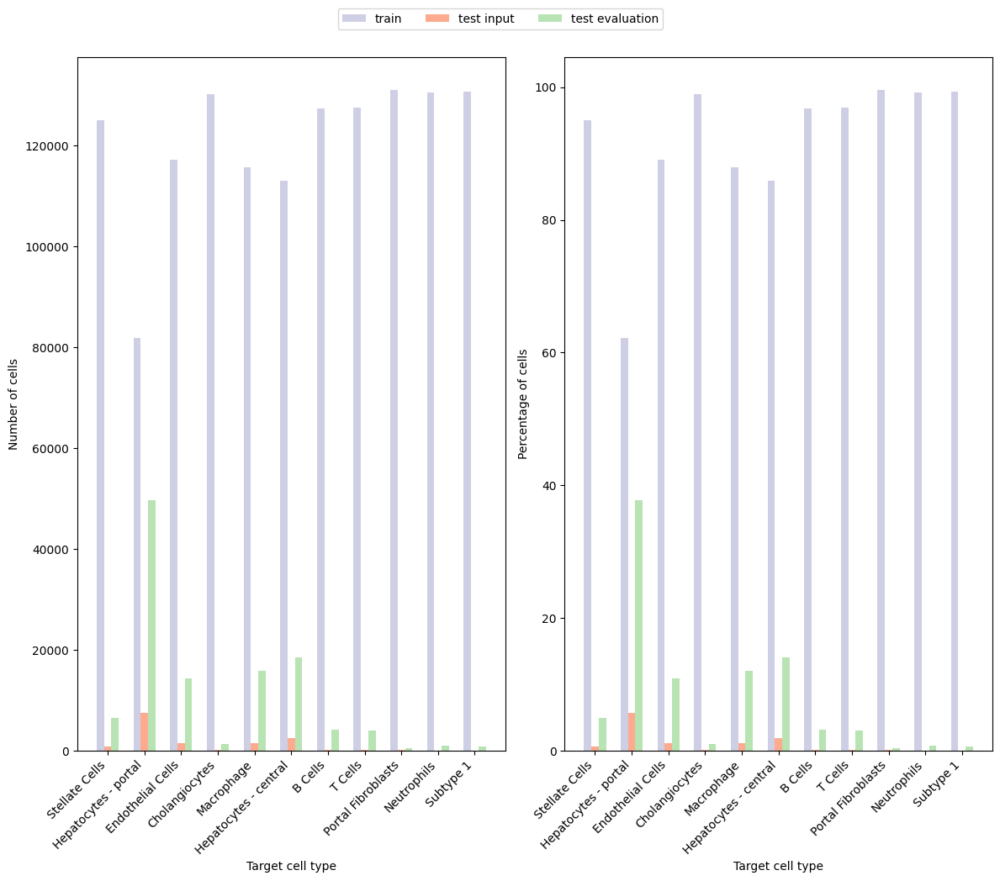

In [103]:
nault = NaultPipeline(preprocessing_pipeline=None)
nault_multiple = NaultMultiplePipeline(
    dataset_pipeline=nault
)

subplot_counts(nault_multiple, filename='nault_bars_split_multiple')


Stellate Cells: train=97164, ctrl test=849, stim test=6581
Hepatocytes - portal: train=53973, ctrl test=7512, stim test=49772
Endothelial Cells: train=89418, ctrl test=1495, stim test=14327
Cholangiocytes: train=102383, ctrl test=109, stim test=1362
Hepatocytes - central: train=85170, ctrl test=2492, stim test=18575
Portal Fibroblasts: train=103164, ctrl test=90, stim test=581
Stellate Cells: train=97164, ctrl test=849, stim test=6581
Stellate Cells with percentage: train=93.65656176201263, ctrl test=0.8183526916959853, stim test=6.343438237987373
Hepatocytes - portal: train=53973, ctrl test=7512, stim test=49772
Hepatocytes - portal with percentage: train=52.0246758879946, ctrl test=7.240830883416067, stim test=47.975324112005396
Endothelial Cells: train=89418, ctrl test=1495, stim test=14327
Endothelial Cells with percentage: train=86.1901778398959, ctrl test=1.441033302809774, stim test=13.809822160104101
Cholangiocytes: train=102383, ctrl test=109, stim test=1362
Cholangiocytes wit

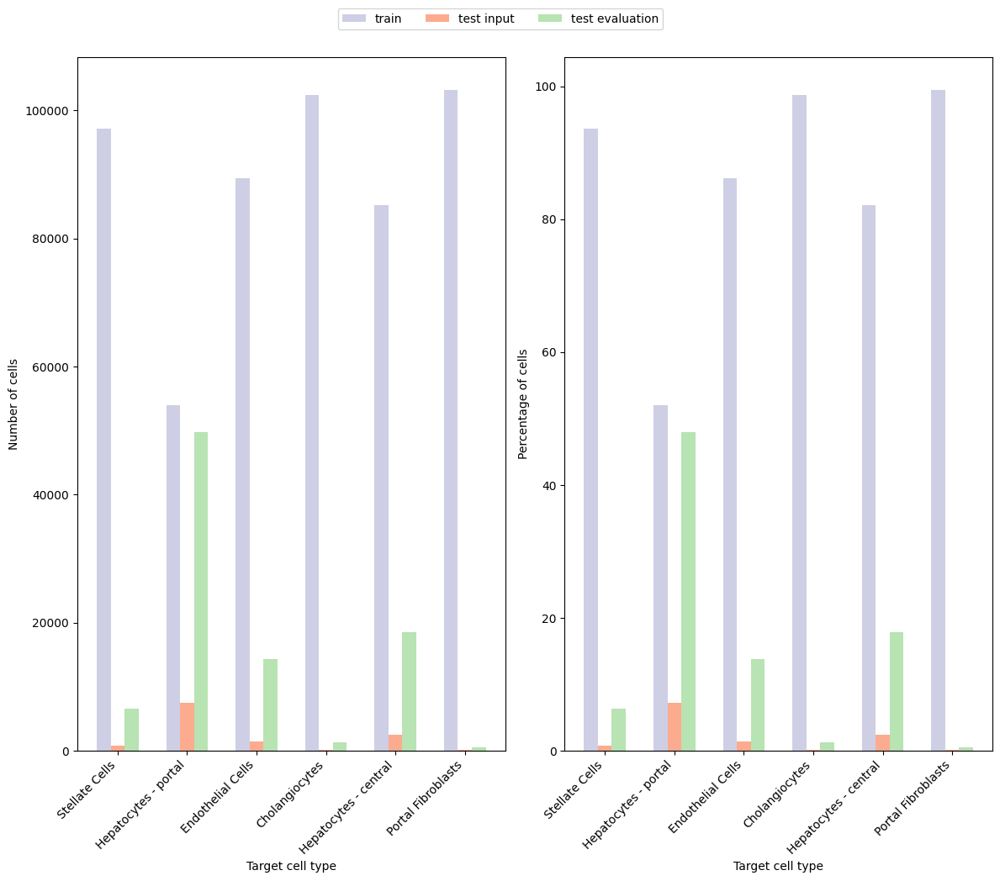

In [104]:
from thesis.datasets import NaultLiverTissuePipeline

nault = NaultLiverTissuePipeline(preprocessing_pipeline=None)
nault_multiple = NaultMultiplePipeline(
    dataset_pipeline=nault
)

subplot_counts(nault_multiple, filename='nault_liver_bars_split_multiple')

/g/kreshuk/katzalis/repos/thesis/thesis/datasets.py:205: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  control.obs["condition"] = "control"
/g/kreshuk/katzalis/repos/thesis/thesis/datasets.py:206: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  perturb.obs["condition"] = "stimulated"


Stellate Cells: train=30536, ctrl test=849, stim test=391
Hepatocytes - portal: train=29853, ctrl test=7512, stim test=1074
Endothelial Cells: train=28075, ctrl test=1495, stim test=2852
Cholangiocytes: train=30327, ctrl test=109, stim test=600
Macrophage: train=24855, ctrl test=1508, stim test=6072
Hepatocytes - central: train=29602, ctrl test=2492, stim test=1325
B Cells: train=29362, ctrl test=208, stim test=1565
T Cells: train=29482, ctrl test=242, stim test=1445
Portal Fibroblasts: train=30851, ctrl test=90, stim test=76
Neutrophils: train=30313, ctrl test=61, stim test=614
Subtype 1: train=30647, ctrl test=67, stim test=280
Stellate Cells: train=30536, ctrl test=849, stim test=391
Stellate Cells with percentage: train=98.73573253144502, ctrl test=2.7451741197012316, stim test=1.2642674685549844
Hepatocytes - portal: train=29853, ctrl test=7512, stim test=1074
Hepatocytes - portal with percentage: train=96.5273062372684, ctrl test=24.28945581530701, stim test=3.4726937627315935
En

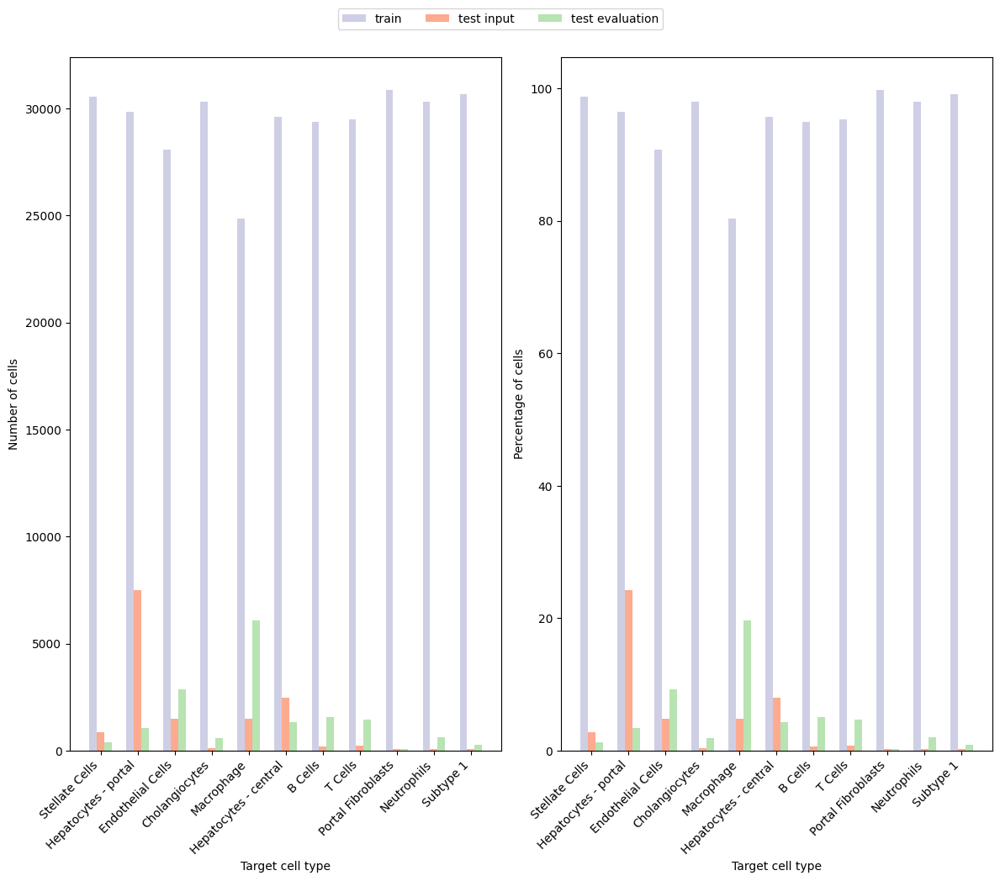

In [105]:
nault = NaultPipeline(preprocessing_pipeline=None)

nault_single = NaultSinglePipeline(
    dataset_pipeline=nault, dosages=30
)

subplot_counts(nault_single, filename='nault_bars_split_30')

/g/kreshuk/katzalis/repos/thesis/thesis/datasets.py:205: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  control.obs["condition"] = "control"
/g/kreshuk/katzalis/repos/thesis/thesis/datasets.py:206: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  perturb.obs["condition"] = "stimulated"


Stellate Cells: train=18474, ctrl test=849, stim test=391
Hepatocytes - portal: train=17791, ctrl test=7512, stim test=1074
Endothelial Cells: train=16013, ctrl test=1495, stim test=2852
Cholangiocytes: train=18265, ctrl test=109, stim test=600
Hepatocytes - central: train=17540, ctrl test=2492, stim test=1325
Portal Fibroblasts: train=18789, ctrl test=90, stim test=76
Stellate Cells: train=18474, ctrl test=849, stim test=391
Stellate Cells with percentage: train=97.92737874370528, ctrl test=4.5003975616220515, stim test=2.0726212562947257
Hepatocytes - portal: train=17791, ctrl test=7512, stim test=1074
Hepatocytes - portal with percentage: train=94.3069175722237, ctrl test=39.81977206467002, stim test=5.6930824277763055
Endothelial Cells: train=16013, ctrl test=1495, stim test=2852
Endothelial Cells with percentage: train=84.8820567187914, ctrl test=7.924728332891598, stim test=15.117943281208587
Cholangiocytes: train=18265, ctrl test=109, stim test=600
Cholangiocytes with percentage

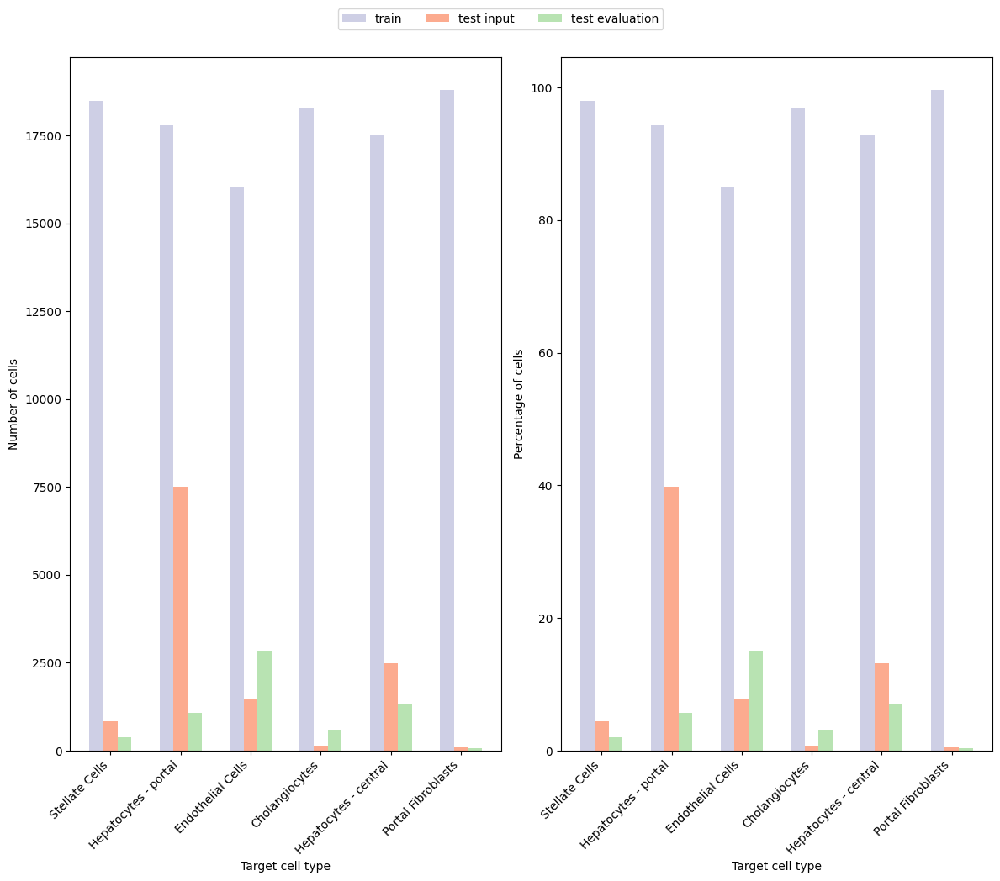

In [106]:
from thesis.datasets import NaultLiverTissuePipeline

nault = NaultLiverTissuePipeline(preprocessing_pipeline=None)

nault_single = NaultSinglePipeline(
    dataset_pipeline=nault, dosages=30
)



subplot_counts(nault_single, filename='nault_liver_bars_split_30')

/g/kreshuk/katzalis/repos/thesis/thesis/datasets.py:268: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  self.control.obs[dose_key] = 0.0
/g/kreshuk/katzalis/repos/thesis/thesis/datasets.py:269: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  self.perturb.obs[dose_key] = -1.0


CD4T: train=15385, ctrl test=2715, stim test=3483
Dendritic: train=18346, ctrl test=670, stim test=522
CD14+Mono: train=18170, ctrl test=2184, stim test=698
CD8T: train=18274, ctrl test=643, stim test=594
FCGR3A+Mono: train=16078, ctrl test=1232, stim test=2790
NK: train=18135, ctrl test=571, stim test=733
B: train=17763, ctrl test=928, stim test=1105
CD4T: train=15385, ctrl test=2715, stim test=3483
CD4T with percentage: train=81.54017383930464, ctrl test=14.38944244223023, stim test=18.459826160695357
Dendritic: train=18346, ctrl test=670, stim test=522
Dendritic with percentage: train=97.23341106635573, ctrl test=3.550985796056816, stim test=2.7665889336442655
CD14+Mono: train=18170, ctrl test=2184, stim test=698
CD14+Mono with percentage: train=96.3006147975408, ctrl test=11.575153699385202, stim test=3.69938520245919
CD8T: train=18274, ctrl test=643, stim test=594
CD8T with percentage: train=96.85181259274962, ctrl test=3.407886368454526, stim test=3.1481874072503713
FCGR3A+Mono: 

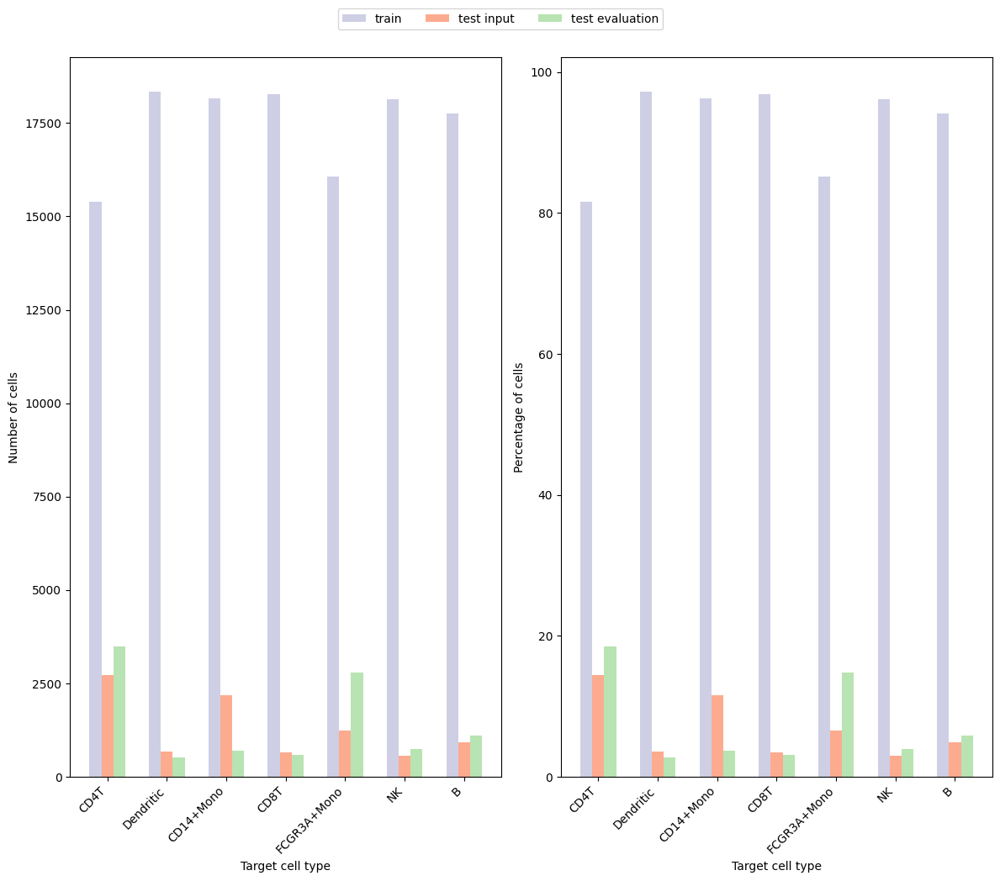

In [107]:
from thesis.datasets import PbmcPipeline, PbmcSinglePipeline

pbmc = PbmcPipeline(preprocessing_pipeline=None)

pbmc_single = PbmcSinglePipeline(
    dataset_pipeline=pbmc
)

subplot_counts(pbmc_single, filename='pbmc_bars_split')
